In [2]:
#Notebook to make plots of the storm-centered properties 
#calculated using the Storm_Centered_Plots.py 
#and Retrieve_Utan_Vtan.py scripts on Discover.

#Started 8 December 2020
#Adapted from Plot_Storm_Centered.ipynb, adding 10-meter (reference level)
#tangential winds instead of vorticity. Tangential winds to be calculated here from
#u_ref and v_ref variables.

#Started 11 December 2020: Take out left panel
#Also add case study for the one strongest storm in V2, but might want to add other variables--ask Jeff about this.
#(Remember, could also add more V1 rows if these exist)

#Started 12 January 2021: add V1 precip. and make V2 strongest storm case study

In [3]:
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import TC_calculations as tcc

from matplotlib.colors import ListedColormap
from matplotlib.colors import BoundaryNorm


from mpl_toolkits.basemap import Basemap

In [4]:
#Load the model data saved by Read_Zhao_TCs.ipynb (21 years--1980-2000)
#(for matching up intensities)
ds_tracks_v1 = xr.open_dataset('nc_from_xarray/zhao_tracks_v1.nc')
ds_tracks_v2 = xr.open_dataset('nc_from_xarray/zhao_tracks_v2.nc')

In [5]:
#Add max wind/min pressure variables
ds_tracks_v1['max_wind_kts'] = ds_tracks_v1['wind_kts'].max(dim='date_time')
ds_tracks_v2['max_wind_kts'] = ds_tracks_v2['wind_kts'].max(dim='date_time')
ds_tracks_v1['min_pressure'] = ds_tracks_v1['pressure'].min(dim='date_time')
ds_tracks_v2['min_pressure'] = ds_tracks_v2['pressure'].min(dim='date_time')

In [5]:
#Load the storm-centered data including V1 precip.
ds_center_old_v1 = xr.open_dataset('nc_from_xarray/storm_centered_peak_intensity_v1.nc')
ds_center_old_v2 = xr.open_dataset('nc_from_xarray/storm_centered_peak_intensity_v2.nc')
ds_uv_v1 = xr.open_dataset('nc_from_xarray/storm_centered_reference_winds_v1.nc')
ds_uv_v2 = xr.open_dataset('nc_from_xarray/storm_centered_reference_winds_v2.nc')
ds_prec_v1 = xr.open_dataset('nc_from_xarray/storm_centered_peak_intensity_prec_v1.nc')

In [6]:
#Calculate tangential and radial velocities from u and v

In [7]:
print('Defining polar coordinates grid')

x_cart = np.linspace(-15, 15, 61)
y_cart = np.linspace(-15, 15, 61)

x_grid, y_grid = np.meshgrid(x_cart, y_cart)

r_grid = np.sqrt(x_grid*x_grid + y_grid*y_grid)
theta_grid = np.arctan2(y_grid, x_grid)

print('r, theta from grid')
print(r_grid)
print(theta_grid)


Defining polar coordinates grid
r, theta from grid
[[21.21320344 20.86264605 20.51828453 ... 20.51828453 20.86264605
  21.21320344]
 [20.86264605 20.50609665 20.15564437 ... 20.15564437 20.50609665
  20.86264605]
 [20.51828453 20.15564437 19.79898987 ... 19.79898987 20.15564437
  20.51828453]
 ...
 [20.51828453 20.15564437 19.79898987 ... 19.79898987 20.15564437
  20.51828453]
 [20.86264605 20.50609665 20.15564437 ... 20.15564437 20.50609665
  20.86264605]
 [21.21320344 20.86264605 20.51828453 ... 20.51828453 20.86264605
  21.21320344]]
[[-2.35619449 -2.33924696 -2.32172539 ... -0.81986726 -0.80234569
  -0.78539816]
 [-2.37314202 -2.35619449 -2.33865243 ... -0.80294022 -0.78539816
  -0.76845063]
 [-2.39066359 -2.37373655 -2.35619449 ... -0.78539816 -0.7678561
  -0.75092906]
 ...
 [ 2.39066359  2.37373655  2.35619449 ...  0.78539816  0.7678561
   0.75092906]
 [ 2.37314202  2.35619449  2.33865243 ...  0.80294022  0.78539816
   0.76845063]
 [ 2.35619449  2.33924696  2.32172539 ...  0.8198

In [8]:
#Now calculate tangential and radial components and add to the NetCDF files

ds_uv_v1['u_rad'] = (ds_uv_v1['u_ref']*np.cos(theta_grid)[:,:,None] +
                     ds_uv_v1['v_ref']*np.sin(theta_grid)[:,:,None])
ds_uv_v1['u_tan'] = (ds_uv_v1['v_ref']*np.cos(theta_grid)[:,:,None] - 
                     ds_uv_v1['u_ref']*np.sin(theta_grid)[:,:,None])

In [9]:
ds_uv_v2['u_rad'] = (ds_uv_v2['u_ref']*np.cos(theta_grid)[:,:,None] +
                     ds_uv_v2['v_ref']*np.sin(theta_grid)[:,:,None])
ds_uv_v2['u_tan'] = (ds_uv_v2['v_ref']*np.cos(theta_grid)[:,:,None] - 
                     ds_uv_v2['u_ref']*np.sin(theta_grid)[:,:,None])

In [10]:
#Merge the "uv" and v1 prec variables into another NetCDF file with the existing centered ones

In [11]:
#print(ds_center_old_v1)
#print(ds_uv_v1)
#Yes, same dimensions

ds_center_v1 = xr.merge([ds_center_old_v1, ds_uv_v1, ds_prec_v1])
ds_center_v2 = xr.merge([ds_center_old_v2, ds_uv_v2])

In [12]:
print(ds_center_v1)
print(ds_center_v2)

<xarray.Dataset>
Dimensions:  (lat: 61, lon: 61, storm: 987)
Coordinates:
  * lat      (lat) float64 -15.0 -14.5 -14.0 -13.5 -13.0 ... 13.5 14.0 14.5 15.0
  * lon      (lon) float64 -15.0 -14.5 -14.0 -13.5 -13.0 ... 13.5 14.0 14.5 15.0
  * storm    (storm) int64 0 1 2 3 4 5 6 7 8 ... 979 980 981 982 983 984 985 986
Data variables:
    slp      (lat, lon, storm) float64 ...
    vort850  (lat, lon, storm) float64 ...
    u_ref    (lat, lon, storm) float64 -4.079 0.5205 7.698 ... 8.101 2.34 -9.209
    v_ref    (lat, lon, storm) float64 0.1749 -2.924 -1.815 ... 1.104 -1.027
    u_rad    (lat, lon, storm) float64 2.761 1.7 -4.16 ... -0.3576 2.436 -7.238
    u_tan    (lat, lon, storm) float64 -3.008 2.436 6.727 ... -0.8739 5.786
    prec     (lat, lon, storm) float64 ...
<xarray.Dataset>
Dimensions:  (lat: 61, lon: 61, storm: 1157)
Coordinates:
  * lat      (lat) float64 -15.0 -14.5 -14.0 -13.5 -13.0 ... 13.5 14.0 14.5 15.0
  * lon      (lon) float64 -15.0 -14.5 -14.0 -13.5 -13.0 ... 13.5 14

In [13]:

#####   SUBSET FOR NORTHERN HEMISPHERE AND INTENSITY BINS   #####  


In [14]:
#Boundaries from Roberts et al. 2020: 
# 920
# 945
# 965
# 980
# 995

#6 columns separated by these 5 values. Also do just Northern Hemisphere.
#How to separate these? And how to organize them?

#Boolean indices for both in_NH and presure in the correct range. 
#Nest these Datasets inside a dict for easy looping.

#Less than or equal to on the upper boundary, greater than on the lower boundary.

In [15]:
ds_subsets = dict()

In [16]:
#Fill in each subset

In [17]:
v1_bool_880_920 = np.logical_and(ds_tracks_v1['gen_NH'], 
                                 ds_tracks_v1['min_pressure'].data <= 9.2)
v1_bool_880_920 = np.arange(len(v1_bool_880_920))[v1_bool_880_920]
ds_subsets['v1_880_920'] = ds_center_v1.isel(storm=v1_bool_880_920)

In [18]:
v1_bool_920_945 = np.logical_and(ds_tracks_v1['gen_NH'], 
                                 np.logical_and(ds_tracks_v1['min_pressure'].data > 9.2,
                                                ds_tracks_v1['min_pressure'].data <= 9.45))
v1_bool_920_945 = np.arange(len(v1_bool_920_945))[v1_bool_920_945]
ds_subsets['v1_920_945'] = ds_center_v1.isel(storm=v1_bool_920_945)

In [19]:
v1_bool_945_965 = np.logical_and(ds_tracks_v1['gen_NH'], 
                                 np.logical_and(ds_tracks_v1['min_pressure'].data > 9.45,
                                                ds_tracks_v1['min_pressure'].data <= 9.65))
v1_bool_945_965 = np.arange(len(v1_bool_945_965))[v1_bool_945_965]
ds_subsets['v1_945_965'] = ds_center_v1.isel(storm=v1_bool_945_965)

In [20]:
v1_bool_965_980 = np.logical_and(ds_tracks_v1['gen_NH'], 
                                 np.logical_and(ds_tracks_v1['min_pressure'].data > 9.65,
                                                ds_tracks_v1['min_pressure'].data <= 9.8))
v1_bool_965_980 = np.arange(len(v1_bool_965_980))[v1_bool_965_980]
ds_subsets['v1_965_980'] = ds_center_v1.isel(storm=v1_bool_965_980)

In [21]:
v1_bool_980_995 = np.logical_and(ds_tracks_v1['gen_NH'], 
                                 np.logical_and(ds_tracks_v1['min_pressure'].data > 9.8,
                                                ds_tracks_v1['min_pressure'].data <= 9.95))
v1_bool_980_995 = np.arange(len(v1_bool_980_995))[v1_bool_980_995]
ds_subsets['v1_980_995'] = ds_center_v1.isel(storm=v1_bool_980_995)

In [22]:
v1_bool_995_1020 = np.logical_and(ds_tracks_v1['gen_NH'], 
                                  np.logical_and(ds_tracks_v1['min_pressure'].data > 9.95,
                                                 ds_tracks_v1['min_pressure'].data <= 10.2))
v1_bool_995_1020 = np.arange(len(v1_bool_995_1020))[v1_bool_995_1020]
ds_subsets['v1_995_1020'] = ds_center_v1.isel(storm=v1_bool_995_1020)

In [23]:
v2_bool_880_920 = np.logical_and(ds_tracks_v2['gen_NH'], 
                                 ds_tracks_v2['min_pressure'].data <= 9.2)
v2_bool_880_920 = np.arange(len(v2_bool_880_920))[v2_bool_880_920]
ds_subsets['v2_880_920'] = ds_center_v2.isel(storm=v2_bool_880_920)

In [24]:
v2_bool_920_945 = np.logical_and(ds_tracks_v2['gen_NH'], 
                                 np.logical_and(ds_tracks_v2['min_pressure'].data > 9.2,
                                                ds_tracks_v2['min_pressure'].data <= 9.45))
v2_bool_920_945 = np.arange(len(v2_bool_920_945))[v2_bool_920_945]
ds_subsets['v2_920_945'] = ds_center_v2.isel(storm=v2_bool_920_945)

In [25]:
v2_bool_945_965 = np.logical_and(ds_tracks_v2['gen_NH'], 
                                 np.logical_and(ds_tracks_v2['min_pressure'].data > 9.45,
                                                ds_tracks_v2['min_pressure'].data <= 9.65))
v2_bool_945_965 = np.arange(len(v2_bool_945_965))[v2_bool_945_965]
ds_subsets['v2_945_965'] = ds_center_v2.isel(storm=v2_bool_945_965)

In [26]:
v2_bool_965_980 = np.logical_and(ds_tracks_v2['gen_NH'], 
                                 np.logical_and(ds_tracks_v2['min_pressure'].data > 9.65,
                                                ds_tracks_v2['min_pressure'].data <= 9.8))
v2_bool_965_980 = np.arange(len(v2_bool_965_980))[v2_bool_965_980]
ds_subsets['v2_965_980'] = ds_center_v2.isel(storm=v2_bool_965_980)

In [27]:
v2_bool_980_995 = np.logical_and(ds_tracks_v2['gen_NH'], 
                                 np.logical_and(ds_tracks_v2['min_pressure'].data > 9.8,
                                                ds_tracks_v2['min_pressure'].data <= 9.95))
v2_bool_980_995 = np.arange(len(v2_bool_980_995))[v2_bool_980_995]
ds_subsets['v2_980_995'] = ds_center_v2.isel(storm=v2_bool_980_995)

In [28]:
v2_bool_995_1020 = np.logical_and(ds_tracks_v2['gen_NH'], 
                                  np.logical_and(ds_tracks_v2['min_pressure'].data > 9.95,
                                                 ds_tracks_v2['min_pressure'].data <= 10.2))
v2_bool_995_1020 = np.arange(len(v2_bool_995_1020))[v2_bool_995_1020]
ds_subsets['v2_995_1020'] = ds_center_v2.isel(storm=v2_bool_995_1020)

In [29]:
print(ds_subsets['v2_995_1020']['olr'])

<xarray.DataArray 'olr' (lat: 61, lon: 61, storm: 16)>
array([[[279.782104, 268.287872, ..., 123.01442 , 251.04129 ],
        [280.218964, 269.442108, ..., 134.960892, 249.026413],
        ...,
        [236.216309, 261.865936, ..., 277.779236, 273.660248],
        [216.625244, 263.279144, ..., 282.047211, 274.353333]],

       [[278.80835 , 259.745331, ..., 124.17318 , 247.345337],
        [277.225006, 266.147705, ..., 133.452805, 250.59314 ],
        ...,
        [230.324951, 257.128845, ..., 274.617249, 268.608002],
        [223.591293, 265.419159, ..., 277.554596, 272.83847 ]],

       ...,

       [[289.768372, 237.823486, ..., 273.231415, 263.630829],
        [290.110046, 260.369812, ..., 272.910919, 263.213898],
        ...,
        [289.115997, 236.120697, ..., 253.240402, 284.526886],
        [287.009857, 242.525238, ..., 251.142212, 280.00473 ]],

       [[284.060547, 260.122681, ..., 269.918274, 264.682404],
        [285.146484, 266.242767, ..., 270.382721, 263.232727],
     

In [30]:
#print(ds_subsets)
#Looks right. One storm < 920 hPa for V2, will be an interesting case study.

In [31]:
#Check what the numbers look like for u and v
print(ds_subsets['v2_995_1020']['u_ref'])

<xarray.DataArray 'u_ref' (lat: 61, lon: 61, storm: 16)>
array([[[ 5.856135, -2.032552, ..., -4.32267 , -1.025245],
        [ 6.167094, -2.16069 , ..., -4.861492, -0.773253],
        ...,
        [ 2.615639, -6.011524, ..., -6.621739, -2.981875],
        [ 2.346063, -6.230929, ..., -6.600904, -2.971755]],

       [[ 5.894499, -2.225565, ..., -3.009944, -0.859793],
        [ 6.139774, -2.355828, ..., -3.089675, -0.908055],
        ...,
        [ 3.045808, -6.57894 , ..., -6.61418 , -2.706747],
        [ 2.644028, -6.757887, ..., -6.60187 , -2.742455]],

       ...,

       [[-4.718031, -2.179476, ...,  0.89626 ,  2.177047],
        [-5.046207, -2.036223, ...,  1.108419,  2.743415],
        ...,
        [-6.195662, -1.213277, ...,  5.867585,  4.525446],
        [-6.052185, -0.222092, ...,  6.284967,  3.851826]],

       [[-4.615649, -2.38316 , ...,  0.927839,  2.434599],
        [-4.955336, -2.218609, ...,  1.042365,  2.97199 ],
        ...,
        [-5.981252, -2.639814, ...,  5.974257,

In [32]:
print(ds_subsets['v2_995_1020']['u_tan'])

<xarray.DataArray 'u_tan' (lat: 61, lon: 61, storm: 16)>
array([[[ 1.11156311e+00, -9.87253807e-01, -6.53977138e+00, ...,
          1.43606080e+00, -6.55524501e+00, -7.68128105e-01],
        [ 1.45708130e+00, -1.25696139e+00, -6.75832810e+00, ...,
          1.10956004e+00, -7.07508908e+00, -7.54456749e-01],
        [ 1.90065955e+00, -4.07055591e+00, -6.91534419e+00, ...,
         -2.03102256e-01, -7.37180149e+00, -1.33324991e+00],
        ...,
        [ 9.89711740e-01, -4.82147172e+00, -2.11676346e+00, ...,
         -2.46336663e+00, -5.33537633e+00, -1.61965916e+00],
        [ 1.36810006e-01, -4.82215861e+00, -1.96942276e+00, ...,
         -2.36222279e+00, -5.17566013e+00, -1.56779557e+00],
        [-2.35325917e-01, -4.83224749e+00, -1.86538158e+00, ...,
         -2.70461882e+00, -5.17863933e+00, -1.55600521e+00]],

       [[ 1.17007807e+00, -1.57017916e+00, -6.07597616e+00, ...,
          8.76040919e-01, -6.35026413e+00, -8.25929681e-01],
        [ 1.45059944e+00, -1.60348977e+00, -6.

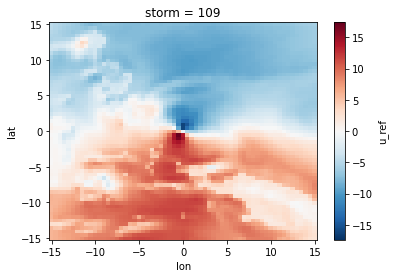

In [33]:
ds_subsets['v2_995_1020']['u_ref'].isel(storm=0).plot()
#Looks like an OK velocity couplet

In [34]:
print(ds_subsets)

{'v1_880_920': <xarray.Dataset>
Dimensions:  (lat: 61, lon: 61, storm: 0)
Coordinates:
  * lat      (lat) float64 -15.0 -14.5 -14.0 -13.5 -13.0 ... 13.5 14.0 14.5 15.0
  * lon      (lon) float64 -15.0 -14.5 -14.0 -13.5 -13.0 ... 13.5 14.0 14.5 15.0
  * storm    (storm) int64 
Data variables:
    slp      (lat, lon, storm) float64 ...
    vort850  (lat, lon, storm) float64 ...
    u_ref    (lat, lon, storm) float64 
    v_ref    (lat, lon, storm) float64 
    u_rad    (lat, lon, storm) float64 
    u_tan    (lat, lon, storm) float64 
    prec     (lat, lon, storm) float64 ..., 'v1_920_945': <xarray.Dataset>
Dimensions:  (lat: 61, lon: 61, storm: 5)
Coordinates:
  * lat      (lat) float64 -15.0 -14.5 -14.0 -13.5 -13.0 ... 13.5 14.0 14.5 15.0
  * lon      (lon) float64 -15.0 -14.5 -14.0 -13.5 -13.0 ... 13.5 14.0 14.5 15.0
  * storm    (storm) int64 218 350 518 555 883
Data variables:
    slp      (lat, lon, storm) float64 ...
    vort850  (lat, lon, storm) float64 ...
    u_ref    (lat, l

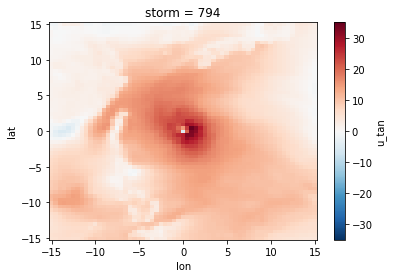

In [35]:
ds_subsets['v2_880_920']['u_tan'].isel(storm=0).plot()

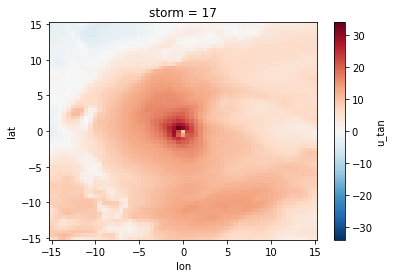

In [36]:
ds_subsets['v2_920_945']['u_tan'].isel(storm=0).plot()

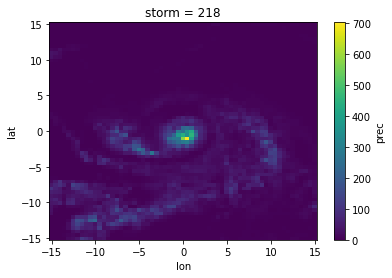

In [37]:
ds_subsets['v1_920_945']['prec'].isel(storm=0).plot()

In [38]:
#Looks fine, 

In [39]:

#####   PLOTS   #####


In [40]:
#How to do this? 6 columns, like Roberts et al. 
#Superimpose pressure contours (in increments of 10 hPa) 
#4 rows: V1 tangential velocity, V2 tangential velocity, V2 OLR, V2 precip.
#Text: variable on y axis labels (left side), 
#Percent of storms inset box or plot titles?
#How to do colorbars? 
#Add 7th column for those
#Could also try velocity contours and pressure colors, like Roberts et al. did.

In [41]:
#List of the pressure boundaries
bstrings = ['880_920', '920_945', '945_965', '965_980', '980_995', '995_1020']

In [42]:
#Titles showing pressure boundaries for the columns
tstrings = ['880-920 hPa', '920-945 hPa', '945-965 hPa', '965-980 hPa', '980-995 hPa', '995-1020 hPa']

/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/matplotlib/contour.py:1494: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/matplotlib/contour.py:1495: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())
/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: No contour levels were found within the data range.
  # Remove the CWD from sys.path while we load stuff.


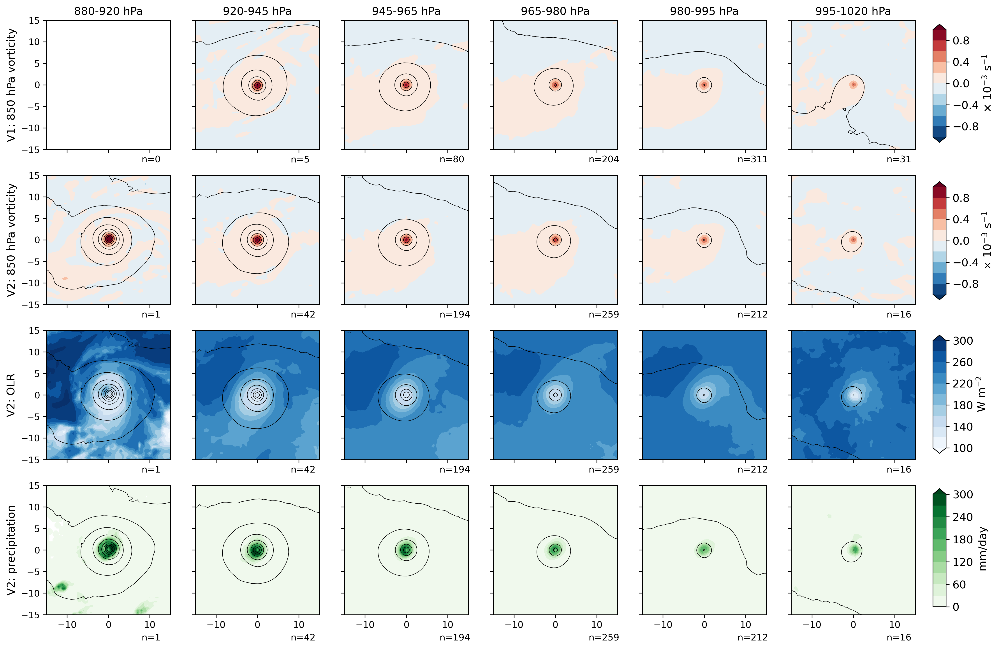

In [39]:
#Version from old script with vorticity, to make sure it still works
fig = plt.figure(figsize=(20,12), dpi=300)

#First row: V1 vorticity. No storm for top left, so skip it

#Blank plot in first spot
plt.subplot(4,7,1)
plt.contour(ds_subsets['v1_'+bstrings[0]]['lon'], 
            ds_subsets['v1_'+bstrings[0]]['lat'],
                np.zeros((61,61))*np.nan)
plt.title(tstrings[0])
plt.gca().xaxis.set_ticklabels([])
plt.ylabel('V1: 850 hPa vorticity', fontsize=12)
#plt.xlabel('n=0', horizontalalignment='right', x=1.0, y=1.0)
plt.text(8, -18, 'n=0', fontsize=10)

for i in np.array([1,2,3,4,5]):
    plt.subplot(4,7,i+1)
    plt.contour(ds_subsets['v1_'+bstrings[i]]['lon'], 
                ds_subsets['v1_'+bstrings[i]]['lat'],
                ds_subsets['v1_'+bstrings[i]]['slp'].mean(dim='storm'), 
                levels=np.linspace(880,1020,15), colors='k', linewidths=0.5)
    plt.contourf(ds_subsets['v1_'+bstrings[i]]['lon'], 
                 ds_subsets['v1_'+bstrings[i]]['lat'],
                 ds_subsets['v1_'+bstrings[i]]['vort850'].mean(dim='storm')*1000, 
                 cmap=plt.cm.RdBu_r, levels=np.linspace(-1, 1, 11), extend='both')
    plt.title(tstrings[i])
    plt.gca().xaxis.set_ticklabels([])
    plt.gca().yaxis.set_ticklabels([])
    plt.text(8, -18, 'n='+str(len(ds_subsets['v1_'+bstrings[i]]['storm'])), fontsize=10)
#Colorbar in rightmost position
cbar = plt.colorbar(cax=fig.add_axes([0.8, 0.725, 0.01, 0.15]))#, ticks=np.linspace(-.25, .25, 5))
cbar.ax.set_ylabel(r'$\times$ 10$^{-3}$ s$^{-1}$', fontsize=12)
cbar.ax.tick_params(labelsize=12)
#cbar.ax.set_xticklabels(['-.25', '-.125', '0', '.125', '.25'])
    
#Second row: V2 vorticity.
for i in np.arange(6):
    plt.subplot(4,7,i+8)
    plt.contour(ds_subsets['v2_'+bstrings[i]]['lon'], 
                ds_subsets['v2_'+bstrings[i]]['lat'],
                ds_subsets['v2_'+bstrings[i]]['slp'].mean(dim='storm'), 
                levels=np.linspace(880,1020,15), colors='k', linewidths=0.5)
    plt.contourf(ds_subsets['v2_'+bstrings[i]]['lon'], 
                 ds_subsets['v2_'+bstrings[i]]['lat'],
                 ds_subsets['v2_'+bstrings[i]]['vort850'].mean(dim='storm')*1000, 
                 cmap=plt.cm.RdBu_r, levels=np.linspace(-1, 1, 11), extend='both')
    plt.gca().xaxis.set_ticklabels([])
    if i > 0:
        plt.gca().yaxis.set_ticklabels([])
    else:
        plt.ylabel('V2: 850 hPa vorticity', fontsize=12)
    plt.text(8, -18, 'n='+str(len(ds_subsets['v2_'+bstrings[i]]['storm'])), fontsize=10)
#Colorbar in rightmost position
cbar = plt.colorbar(cax=fig.add_axes([0.8, 0.525, 0.01, 0.15]))#, ticks=np.linspace(-.25, .25, 5))
cbar.ax.set_ylabel(r'$\times$ 10$^{-3}$ s$^{-1}$', fontsize=12)
cbar.ax.tick_params(labelsize=12)
#cbar.ax.set_xticklabels(['-.25', '-.125', '0', '.125', '.25'])

#Third row: V2 OLR.
for i in np.arange(6):
    plt.subplot(4,7,i+15)
    plt.contour(ds_subsets['v2_'+bstrings[i]]['lon'], 
                ds_subsets['v2_'+bstrings[i]]['lat'],
                ds_subsets['v2_'+bstrings[i]]['slp'].mean(dim='storm'), 
                levels=np.linspace(880,1020,15), colors='k', linewidths=0.5)
    plt.contourf(ds_subsets['v2_'+bstrings[i]]['lon'], 
                 ds_subsets['v2_'+bstrings[i]]['lat'],
                 ds_subsets['v2_'+bstrings[i]]['olr'].mean(dim='storm'),
                 cmap=plt.cm.Blues, levels=np.linspace(100,300,11), extend='both')
    plt.gca().xaxis.set_ticklabels([])
    if i > 0:
        plt.gca().yaxis.set_ticklabels([])
    else:
        plt.ylabel('V2: OLR', fontsize=12)
    plt.text(8, -18, 'n='+str(len(ds_subsets['v2_'+bstrings[i]]['storm'])), fontsize=10)
cbar = plt.colorbar(cax=fig.add_axes([0.8, 0.33, 0.01, 0.15]))#, ticks=np.linspace(-.25, .25, 5))
cbar.ax.set_ylabel('W m$^{-2}$', fontsize=12)
cbar.ax.tick_params(labelsize=12)
    
#Fourth row: V2 precip.
for i in np.arange(6):
    plt.subplot(4,7,i+22)
    plt.contour(ds_subsets['v2_'+bstrings[i]]['lon'], 
                ds_subsets['v2_'+bstrings[i]]['lat'],
                ds_subsets['v2_'+bstrings[i]]['slp'].mean(dim='storm'), 
                levels=np.linspace(880,1020,15), colors='k', linewidths=0.5)
    plt.contourf(ds_subsets['v2_'+bstrings[i]]['lon'], 
                 ds_subsets['v2_'+bstrings[i]]['lat'],
                 ds_subsets['v2_'+bstrings[i]]['precip'].mean(dim='storm'), 
                 cmap=plt.cm.Greens, levels=np.linspace(0,300,11), extend='max')
    if i > 0:
        plt.gca().yaxis.set_ticklabels([])
    else:
        plt.ylabel('V2: precipitation', fontsize=12)
    plt.text(8, -21, 'n='+str(len(ds_subsets['v2_'+bstrings[i]]['storm'])), fontsize=10)
cbar = plt.colorbar(cax=fig.add_axes([0.8, 0.135, 0.01, 0.15]))#, ticks=np.linspace(-.25, .25, 5))
cbar.ax.set_ylabel('mm/day', fontsize=12)
cbar.ax.tick_params(labelsize=12)
    
#plt.tight_layout()

plt.savefig('plots/storm_centered_NH_24_panels.png')


/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/matplotlib/contour.py:1494: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/matplotlib/contour.py:1495: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())
/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: No contour levels were found within the data range.
  # Remove the CWD from sys.path while we load stuff.


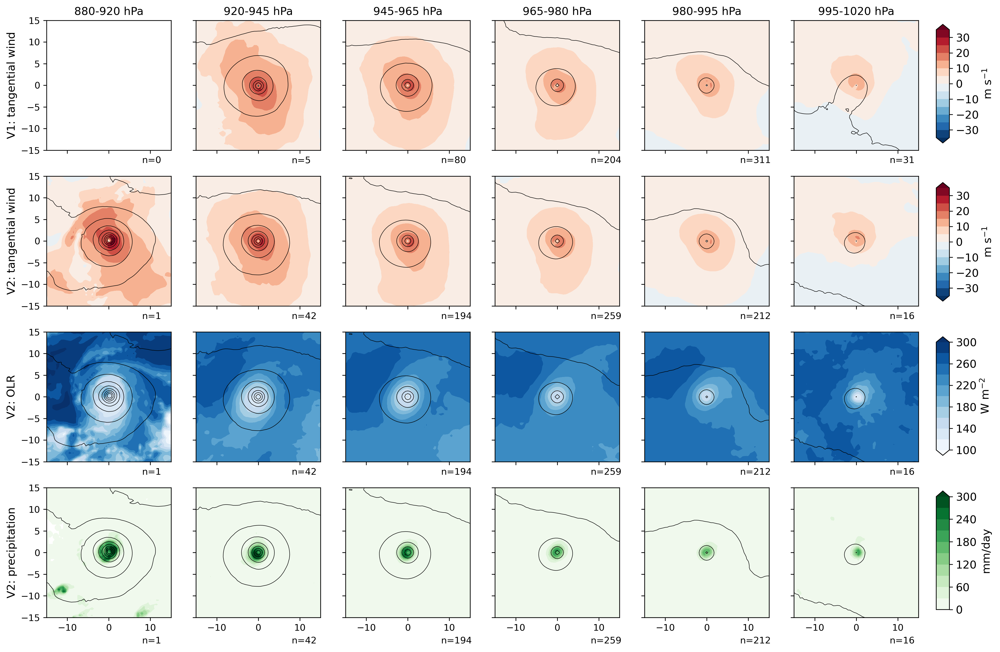

In [46]:
#Version with tangential velocity in the top two rows instead
fig = plt.figure(figsize=(20,12), dpi=300)

#First row: V1 tangential velocity. No storm for top left, so skip it

#Blank plot in first spot
plt.subplot(4,7,1)
plt.contour(ds_subsets['v1_'+bstrings[0]]['lon'], 
            ds_subsets['v1_'+bstrings[0]]['lat'],
                np.zeros((61,61))*np.nan)
plt.title(tstrings[0])
plt.gca().xaxis.set_ticklabels([])
plt.ylabel('V1: tangential wind', fontsize=12)
#plt.xlabel('n=0', horizontalalignment='right', x=1.0, y=1.0)
plt.text(8, -18, 'n=0', fontsize=10)

for i in np.array([1,2,3,4,5]):
    plt.subplot(4,7,i+1)
    plt.contour(ds_subsets['v1_'+bstrings[i]]['lon'], 
                ds_subsets['v1_'+bstrings[i]]['lat'],
                ds_subsets['v1_'+bstrings[i]]['slp'].mean(dim='storm'), 
                levels=np.linspace(880,1020,15), colors='k', linewidths=0.5)
    plt.contourf(ds_subsets['v1_'+bstrings[i]]['lon'], 
                 ds_subsets['v1_'+bstrings[i]]['lat'],
                 ds_subsets['v1_'+bstrings[i]]['u_tan'].mean(dim='storm'), 
                 cmap=plt.cm.RdBu_r, levels=np.linspace(-35, 35, 15), extend='both')
    plt.title(tstrings[i])
    plt.gca().xaxis.set_ticklabels([])
    plt.gca().yaxis.set_ticklabels([])
    plt.text(8, -18, 'n='+str(len(ds_subsets['v1_'+bstrings[i]]['storm'])), fontsize=10)
#Colorbar in rightmost position
cbar = plt.colorbar(cax=fig.add_axes([0.8, 0.725, 0.01, 0.15]))#, ticks=np.linspace(-.25, .25, 5))
cbar.ax.set_ylabel('m s$^{-1}$', fontsize=12)
cbar.ax.tick_params(labelsize=12)
#cbar.ax.set_xticklabels(['-.25', '-.125', '0', '.125', '.25'])
    
#Second row: V2 vorticity.
for i in np.arange(6):
    plt.subplot(4,7,i+8)
    plt.contour(ds_subsets['v2_'+bstrings[i]]['lon'], 
                ds_subsets['v2_'+bstrings[i]]['lat'],
                ds_subsets['v2_'+bstrings[i]]['slp'].mean(dim='storm'), 
                levels=np.linspace(880,1020,15), colors='k', linewidths=0.5)
    plt.contourf(ds_subsets['v2_'+bstrings[i]]['lon'], 
                 ds_subsets['v2_'+bstrings[i]]['lat'],
                 ds_subsets['v2_'+bstrings[i]]['u_tan'].mean(dim='storm'), 
                 cmap=plt.cm.RdBu_r, levels=np.linspace(-35, 35, 15), extend='both')
    plt.gca().xaxis.set_ticklabels([])
    if i > 0:
        plt.gca().yaxis.set_ticklabels([])
    else:
        plt.ylabel('V2: tangential wind', fontsize=12)
    plt.text(8, -18, 'n='+str(len(ds_subsets['v2_'+bstrings[i]]['storm'])), fontsize=10)
#Colorbar in rightmost position
cbar = plt.colorbar(cax=fig.add_axes([0.8, 0.525, 0.01, 0.15]))#, ticks=np.linspace(-.25, .25, 5))
cbar.ax.set_ylabel('m s$^{-1}$', fontsize=12)
cbar.ax.tick_params(labelsize=12)
#cbar.ax.set_xticklabels(['-.25', '-.125', '0', '.125', '.25'])

#Third row: V2 OLR.
for i in np.arange(6):
    plt.subplot(4,7,i+15)
    plt.contour(ds_subsets['v2_'+bstrings[i]]['lon'], 
                ds_subsets['v2_'+bstrings[i]]['lat'],
                ds_subsets['v2_'+bstrings[i]]['slp'].mean(dim='storm'), 
                levels=np.linspace(880,1020,15), colors='k', linewidths=0.5)
    plt.contourf(ds_subsets['v2_'+bstrings[i]]['lon'], 
                 ds_subsets['v2_'+bstrings[i]]['lat'],
                 ds_subsets['v2_'+bstrings[i]]['olr'].mean(dim='storm'),
                 cmap=plt.cm.Blues, levels=np.linspace(100,300,11), extend='both')
    plt.gca().xaxis.set_ticklabels([])
    if i > 0:
        plt.gca().yaxis.set_ticklabels([])
    else:
        plt.ylabel('V2: OLR', fontsize=12)
    plt.text(8, -18, 'n='+str(len(ds_subsets['v2_'+bstrings[i]]['storm'])), fontsize=10)
cbar = plt.colorbar(cax=fig.add_axes([0.8, 0.33, 0.01, 0.15]))#, ticks=np.linspace(-.25, .25, 5))
cbar.ax.set_ylabel('W m$^{-2}$', fontsize=12)
cbar.ax.tick_params(labelsize=12)
    
#Fourth row: V2 precip.
for i in np.arange(6):
    plt.subplot(4,7,i+22)
    plt.contour(ds_subsets['v2_'+bstrings[i]]['lon'], 
                ds_subsets['v2_'+bstrings[i]]['lat'],
                ds_subsets['v2_'+bstrings[i]]['slp'].mean(dim='storm'), 
                levels=np.linspace(880,1020,15), colors='k', linewidths=0.5)
    plt.contourf(ds_subsets['v2_'+bstrings[i]]['lon'], 
                 ds_subsets['v2_'+bstrings[i]]['lat'],
                 ds_subsets['v2_'+bstrings[i]]['precip'].mean(dim='storm'), 
                 cmap=plt.cm.Greens, levels=np.linspace(0,300,11), extend='max')
    if i > 0:
        plt.gca().yaxis.set_ticklabels([])
    else:
        plt.ylabel('V2: precipitation', fontsize=12)
    plt.text(8, -21, 'n='+str(len(ds_subsets['v2_'+bstrings[i]]['storm'])), fontsize=10)
cbar = plt.colorbar(cax=fig.add_axes([0.8, 0.135, 0.01, 0.15]))#, ticks=np.linspace(-.25, .25, 5))
cbar.ax.set_ylabel('mm/day', fontsize=12)
cbar.ax.tick_params(labelsize=12)
    
#plt.tight_layout()

plt.savefig('plots/storm_centered_NH_24_panels_tangetial.png')


/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/matplotlib/contour.py:1494: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/matplotlib/contour.py:1495: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())
/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: No contour levels were found within the data range.
  # Remove the CWD from sys.path while we load stuff.
/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_launcher.py:26: UserWarning: No contour levels were found within the data range.
/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_launcher.py:26: UserWarning: No contour levels were found within the data range.
/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_launcher.py:26: UserWarning: No contour levels were fou

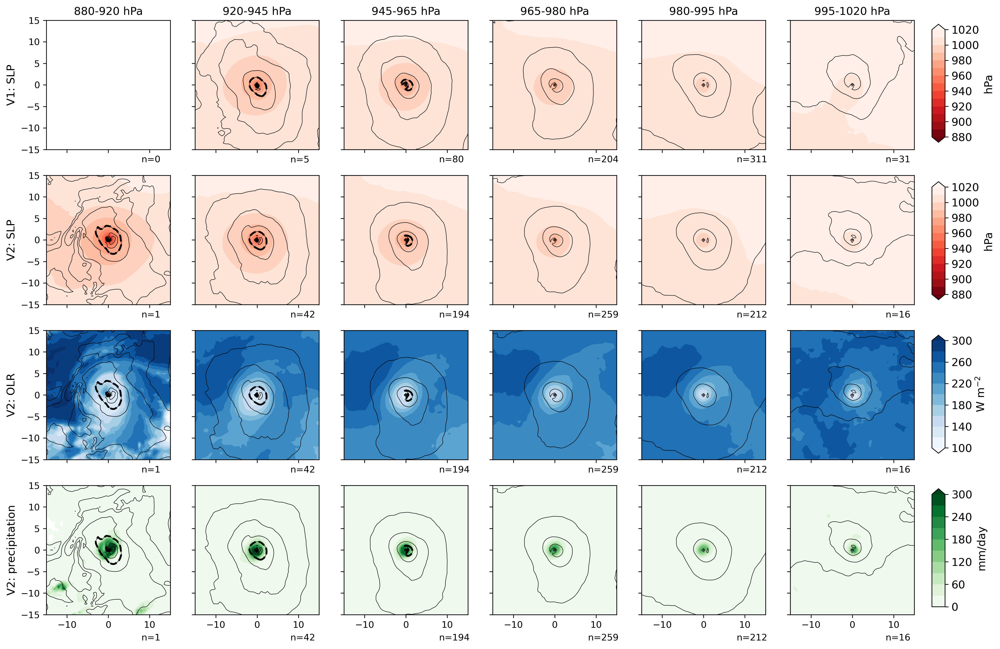

In [47]:
#Version with tangential velocity as contours instead of pressure; top 2 rows with pressure as colors
fig = plt.figure(figsize=(20,12), dpi=300)

#First row: V1 tangential velocity. No storm for top left, so skip it

#Blank plot in first spot
plt.subplot(4,7,1)
plt.contour(ds_subsets['v1_'+bstrings[0]]['lon'], 
            ds_subsets['v1_'+bstrings[0]]['lat'],
                np.zeros((61,61))*np.nan)
plt.title(tstrings[0])
plt.gca().xaxis.set_ticklabels([])
plt.ylabel('V1: SLP', fontsize=12)
#plt.xlabel('n=0', horizontalalignment='right', x=1.0, y=1.0)
plt.text(8, -18, 'n=0', fontsize=10)

for i in np.array([1,2,3,4,5]):
    plt.subplot(4,7,i+1)
    plt.contour(ds_subsets['v1_'+bstrings[i]]['lon'], 
                ds_subsets['v1_'+bstrings[i]]['lat'],
                ds_subsets['v1_'+bstrings[i]]['u_tan'].mean(dim='storm'), 
                levels=np.linspace(-45,45,19), colors='k', linewidths=0.5)    
    plt.contour(ds_subsets['v1_'+bstrings[i]]['lon'], 
                ds_subsets['v1_'+bstrings[i]]['lat'],
                ds_subsets['v1_'+bstrings[i]]['u_tan'].mean(dim='storm'), 
                levels=[20], colors='k', linewidths=2, linestyles='dashed')
    plt.contourf(ds_subsets['v1_'+bstrings[i]]['lon'], 
                 ds_subsets['v1_'+bstrings[i]]['lat'],
                 ds_subsets['v1_'+bstrings[i]]['slp'].mean(dim='storm'), 
                 cmap=plt.cm.Reds_r, levels=np.linspace(880, 1020, 15), extend='both')
    plt.title(tstrings[i])
    plt.gca().xaxis.set_ticklabels([])
    plt.gca().yaxis.set_ticklabels([])
    plt.text(8, -18, 'n='+str(len(ds_subsets['v1_'+bstrings[i]]['storm'])), fontsize=10)
#Colorbar in rightmost position
cbar = plt.colorbar(cax=fig.add_axes([0.8, 0.725, 0.01, 0.15]))#, ticks=np.linspace(-.25, .25, 5))
cbar.ax.set_ylabel('hPa', fontsize=12)
cbar.ax.tick_params(labelsize=12)
#cbar.ax.set_xticklabels(['-.25', '-.125', '0', '.125', '.25'])
    
#Second row: V2 vorticity.
for i in np.arange(6):
    plt.subplot(4,7,i+8)
    plt.contour(ds_subsets['v2_'+bstrings[i]]['lon'], 
                ds_subsets['v2_'+bstrings[i]]['lat'],
                ds_subsets['v2_'+bstrings[i]]['u_tan'].mean(dim='storm'), 
                levels=np.linspace(-45,45,19), colors='k', linewidths=0.5)
    plt.contour(ds_subsets['v2_'+bstrings[i]]['lon'], 
                ds_subsets['v2_'+bstrings[i]]['lat'],
                ds_subsets['v2_'+bstrings[i]]['u_tan'].mean(dim='storm'), 
                levels=[20], colors='k', linewidths=2, linestyles='dashed')
    plt.contourf(ds_subsets['v2_'+bstrings[i]]['lon'], 
                 ds_subsets['v2_'+bstrings[i]]['lat'],
                 ds_subsets['v2_'+bstrings[i]]['slp'].mean(dim='storm'), 
                 cmap=plt.cm.Reds_r, levels=np.linspace(880, 1020, 15), extend='both')
    plt.gca().xaxis.set_ticklabels([])
    if i > 0:
        plt.gca().yaxis.set_ticklabels([])
    else:
        plt.ylabel('V2: SLP', fontsize=12)
    plt.text(8, -18, 'n='+str(len(ds_subsets['v2_'+bstrings[i]]['storm'])), fontsize=10)
#Colorbar in rightmost position
cbar = plt.colorbar(cax=fig.add_axes([0.8, 0.525, 0.01, 0.15]))#, ticks=np.linspace(-.25, .25, 5))
cbar.ax.set_ylabel('hPa', fontsize=12)
cbar.ax.tick_params(labelsize=12)
#cbar.ax.set_xticklabels(['-.25', '-.125', '0', '.125', '.25'])

#Third row: V2 OLR.
for i in np.arange(6):
    plt.subplot(4,7,i+15)
    plt.contour(ds_subsets['v2_'+bstrings[i]]['lon'], 
                ds_subsets['v2_'+bstrings[i]]['lat'],
                ds_subsets['v2_'+bstrings[i]]['u_tan'].mean(dim='storm'), 
                levels=np.linspace(-45,45,19), colors='k', linewidths=0.5)
    plt.contour(ds_subsets['v2_'+bstrings[i]]['lon'], 
                ds_subsets['v2_'+bstrings[i]]['lat'],
                ds_subsets['v2_'+bstrings[i]]['u_tan'].mean(dim='storm'), 
                levels=[20], colors='k', linewidths=2, linestyles='dashed')
    plt.contourf(ds_subsets['v2_'+bstrings[i]]['lon'], 
                 ds_subsets['v2_'+bstrings[i]]['lat'],
                 ds_subsets['v2_'+bstrings[i]]['olr'].mean(dim='storm'),
                 cmap=plt.cm.Blues, levels=np.linspace(100,300,11), extend='both')
    plt.gca().xaxis.set_ticklabels([])
    if i > 0:
        plt.gca().yaxis.set_ticklabels([])
    else:
        plt.ylabel('V2: OLR', fontsize=12)
    plt.text(8, -18, 'n='+str(len(ds_subsets['v2_'+bstrings[i]]['storm'])), fontsize=10)
cbar = plt.colorbar(cax=fig.add_axes([0.8, 0.33, 0.01, 0.15]))#, ticks=np.linspace(-.25, .25, 5))
cbar.ax.set_ylabel('W m$^{-2}$', fontsize=12)
cbar.ax.tick_params(labelsize=12)
    
#Fourth row: V2 precip.
for i in np.arange(6):
    plt.subplot(4,7,i+22)
    plt.contour(ds_subsets['v2_'+bstrings[i]]['lon'], 
                ds_subsets['v2_'+bstrings[i]]['lat'],
                ds_subsets['v2_'+bstrings[i]]['u_tan'].mean(dim='storm'), 
                levels=np.linspace(-45,45,19), colors='k', linewidths=0.5)
    plt.contour(ds_subsets['v2_'+bstrings[i]]['lon'], 
                ds_subsets['v2_'+bstrings[i]]['lat'],
                ds_subsets['v2_'+bstrings[i]]['u_tan'].mean(dim='storm'), 
                levels=[20], colors='k', linewidths=2, linestyles='dashed')
    plt.contourf(ds_subsets['v2_'+bstrings[i]]['lon'], 
                 ds_subsets['v2_'+bstrings[i]]['lat'],
                 ds_subsets['v2_'+bstrings[i]]['precip'].mean(dim='storm'), 
                 cmap=plt.cm.Greens, levels=np.linspace(0,300,11), extend='max')
    if i > 0:
        plt.gca().yaxis.set_ticklabels([])
    else:
        plt.ylabel('V2: precipitation', fontsize=12)
    plt.text(8, -21, 'n='+str(len(ds_subsets['v2_'+bstrings[i]]['storm'])), fontsize=10)
cbar = plt.colorbar(cax=fig.add_axes([0.8, 0.135, 0.01, 0.15]))#, ticks=np.linspace(-.25, .25, 5))
cbar.ax.set_ylabel('mm/day', fontsize=12)
cbar.ax.tick_params(labelsize=12)
    
#plt.tight_layout()

plt.savefig('plots/storm_centered_NH_24_panels_tangetial_contours.png')


/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_launcher.py:17: UserWarning: No contour levels were found within the data range.
/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_launcher.py:17: UserWarning: No contour levels were found within the data range.
/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_launcher.py:17: UserWarning: No contour levels were found within the data range.
/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_launcher.py:45: UserWarning: No contour levels were found within the data range.
/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_launcher.py:45: UserWarning: No contour levels were found within the data range.
/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_launcher.py:45: UserWarning: No contour levels were found within the data range.
/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_lau

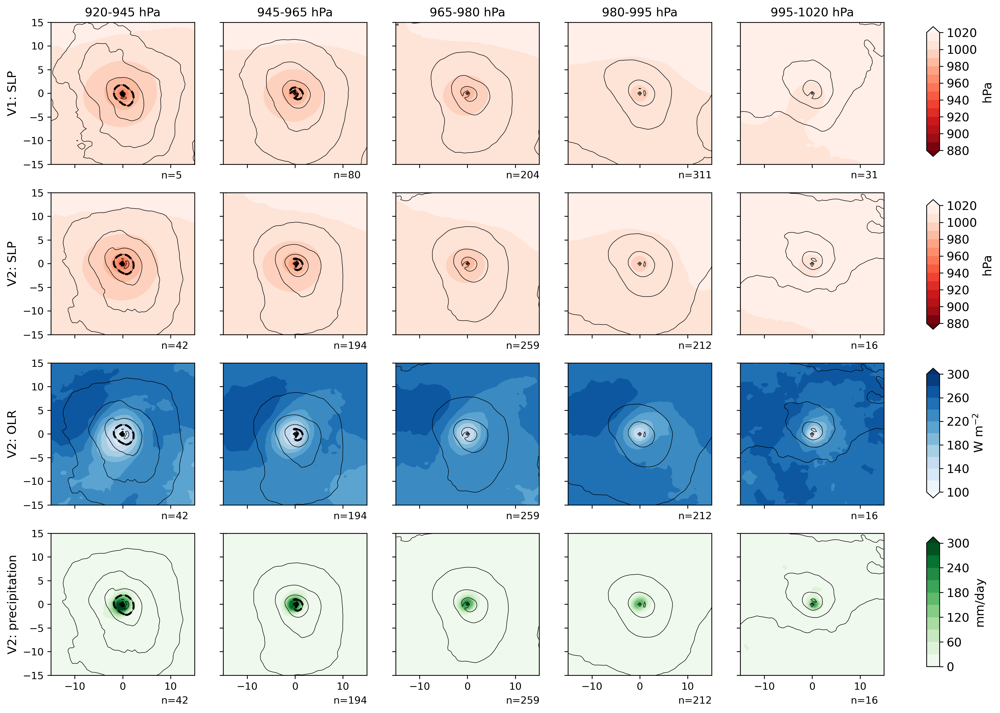

In [92]:
#Version of the above omitting left column

fig = plt.figure(figsize=(18,12), dpi=300)

#First row: V1 tangential velocity

#Blank plot in first spot
for i in np.arange(5):
    plt.subplot(4,6,i+1)
    plt.contour(ds_subsets['v1_'+bstrings[i+1]]['lon'], 
                ds_subsets['v1_'+bstrings[i+1]]['lat'],
                ds_subsets['v1_'+bstrings[i+1]]['u_tan'].mean(dim='storm'), 
                levels=np.linspace(-45,45,19), colors='k', linewidths=0.5)    
    plt.contour(ds_subsets['v1_'+bstrings[i+1]]['lon'], 
                ds_subsets['v1_'+bstrings[i+1]]['lat'],
                ds_subsets['v1_'+bstrings[i+1]]['u_tan'].mean(dim='storm'), 
                levels=[20], colors='k', linewidths=2, linestyles='dashed')
    plt.contourf(ds_subsets['v1_'+bstrings[i+1]]['lon'], 
                 ds_subsets['v1_'+bstrings[i+1]]['lat'],
                 ds_subsets['v1_'+bstrings[i+1]]['slp'].mean(dim='storm'), 
                 cmap=plt.cm.Reds_r, levels=np.linspace(880, 1020, 15), extend='both')
    plt.title(tstrings[i+1])
    plt.gca().xaxis.set_ticklabels([])
    if i > 0:
        plt.gca().yaxis.set_ticklabels([])
    else:
        plt.ylabel('V1: SLP', fontsize=12)
    plt.text(8, -18, 'n='+str(len(ds_subsets['v1_'+bstrings[i+1]]['storm'])), fontsize=10)
#Colorbar in rightmost position
cbar = plt.colorbar(cax=fig.add_axes([0.8, 0.725, 0.01, 0.15]))#, ticks=np.linspace(-.25, .25, 5))
cbar.ax.set_ylabel('hPa', fontsize=12)
cbar.ax.tick_params(labelsize=12)
#cbar.ax.set_xticklabels(['-.25', '-.125', '0', '.125', '.25'])
    
#Second row: V2 vorticity.
for i in np.arange(5):
    plt.subplot(4,6,i+7)
    plt.contour(ds_subsets['v2_'+bstrings[i+1]]['lon'], 
                ds_subsets['v2_'+bstrings[i+1]]['lat'],
                ds_subsets['v2_'+bstrings[i+1]]['u_tan'].mean(dim='storm'), 
                levels=np.linspace(-45,45,19), colors='k', linewidths=0.5)
    plt.contour(ds_subsets['v2_'+bstrings[i+1]]['lon'], 
                ds_subsets['v2_'+bstrings[i+1]]['lat'],
                ds_subsets['v2_'+bstrings[i+1]]['u_tan'].mean(dim='storm'), 
                levels=[20], colors='k', linewidths=2, linestyles='dashed')
    plt.contourf(ds_subsets['v2_'+bstrings[i+1]]['lon'], 
                 ds_subsets['v2_'+bstrings[i+1]]['lat'],
                 ds_subsets['v2_'+bstrings[i+1]]['slp'].mean(dim='storm'), 
                 cmap=plt.cm.Reds_r, levels=np.linspace(880, 1020, 15), extend='both')
    plt.gca().xaxis.set_ticklabels([])
    if i > 0:
        plt.gca().yaxis.set_ticklabels([])
    else:
        plt.ylabel('V2: SLP', fontsize=12)
    plt.text(8, -18, 'n='+str(len(ds_subsets['v2_'+bstrings[i+1]]['storm'])), fontsize=10)
#Colorbar in rightmost position
cbar = plt.colorbar(cax=fig.add_axes([0.8, 0.525, 0.01, 0.15]))#, ticks=np.linspace(-.25, .25, 5))
cbar.ax.set_ylabel('hPa', fontsize=12)
cbar.ax.tick_params(labelsize=12)
#cbar.ax.set_xticklabels(['-.25', '-.125', '0', '.125', '.25'])

#Third row: V2 OLR.
for i in np.arange(5):
    plt.subplot(4,6,i+13)
    plt.contour(ds_subsets['v2_'+bstrings[i+1]]['lon'], 
                ds_subsets['v2_'+bstrings[i+1]]['lat'],
                ds_subsets['v2_'+bstrings[i+1]]['u_tan'].mean(dim='storm'), 
                levels=np.linspace(-45,45,19), colors='k', linewidths=0.5)
    plt.contour(ds_subsets['v2_'+bstrings[i+1]]['lon'], 
                ds_subsets['v2_'+bstrings[i+1]]['lat'],
                ds_subsets['v2_'+bstrings[i+1]]['u_tan'].mean(dim='storm'), 
                levels=[20], colors='k', linewidths=2, linestyles='dashed')
    plt.contourf(ds_subsets['v2_'+bstrings[i+1]]['lon'], 
                 ds_subsets['v2_'+bstrings[i+1]]['lat'],
                 ds_subsets['v2_'+bstrings[i+1]]['olr'].mean(dim='storm'),
                 cmap=plt.cm.Blues, levels=np.linspace(100,300,11), extend='both')
    plt.gca().xaxis.set_ticklabels([])
    if i > 0:
        plt.gca().yaxis.set_ticklabels([])
    else:
        plt.ylabel('V2: OLR', fontsize=12)
    plt.text(8, -18, 'n='+str(len(ds_subsets['v2_'+bstrings[i+1]]['storm'])), fontsize=10)
cbar = plt.colorbar(cax=fig.add_axes([0.8, 0.33, 0.01, 0.15]))#, ticks=np.linspace(-.25, .25, 5))
cbar.ax.set_ylabel('W m$^{-2}$', fontsize=12)
cbar.ax.tick_params(labelsize=12)
    
#Fourth row: V2 precip.
for i in np.arange(5):
    plt.subplot(4,6,i+19)
    plt.contour(ds_subsets['v2_'+bstrings[i+1]]['lon'], 
                ds_subsets['v2_'+bstrings[i+1]]['lat'],
                ds_subsets['v2_'+bstrings[i+1]]['u_tan'].mean(dim='storm'), 
                levels=np.linspace(-45,45,19), colors='k', linewidths=0.5)
    plt.contour(ds_subsets['v2_'+bstrings[i+1]]['lon'], 
                ds_subsets['v2_'+bstrings[i+1]]['lat'],
                ds_subsets['v2_'+bstrings[i+1]]['u_tan'].mean(dim='storm'), 
                levels=[20], colors='k', linewidths=2, linestyles='dashed')
    plt.contourf(ds_subsets['v2_'+bstrings[i+1]]['lon'], 
                 ds_subsets['v2_'+bstrings[i+1]]['lat'],
                 ds_subsets['v2_'+bstrings[i+1]]['precip'].mean(dim='storm'), 
                 cmap=plt.cm.Greens, levels=np.linspace(0,300,11), extend='max')
    if i > 0:
        plt.gca().yaxis.set_ticklabels([])
    else:
        plt.ylabel('V2: precipitation', fontsize=12)
    plt.text(8, -21, 'n='+str(len(ds_subsets['v2_'+bstrings[i+1]]['storm'])), fontsize=10)
cbar = plt.colorbar(cax=fig.add_axes([0.8, 0.135, 0.01, 0.15]))#, ticks=np.linspace(-.25, .25, 5))
cbar.ax.set_ylabel('mm/day', fontsize=12)
cbar.ax.tick_params(labelsize=12)
    
#plt.tight_layout()

plt.savefig('plots/storm_centered_NH_20_panels_tangetial_contours_5columns.png', transparent=False)

In [43]:
#Version with V1 precip. and changed colorbar for precip.

In [44]:
#Define precip. colorbar

#Matching NWS precip. plots: from http://jjhelmus.github.io/blog/2013/09/17/plotting-nsw-precipitation-data/

nws_precip_colors = [
    "#04e9e7",  # 0.01 - 0.10 inches
    "#019ff4",  # 0.10 - 0.25 inches
    "#0300f4",  # 0.25 - 0.50 inches
    "#02fd02",  # 0.50 - 0.75 inches
    "#01c501",  # 0.75 - 1.00 inches
    "#008e00",  # 1.00 - 1.50 inches
    "#fdf802",  # 1.50 - 2.00 inches
    "#e5bc00",  # 2.00 - 2.50 inches
    "#fd9500",  # 2.50 - 3.00 inches
    "#fd0000",  # 3.00 - 4.00 inches
    "#d40000",  # 4.00 - 5.00 inches
    "#bc0000",  # 5.00 - 6.00 inches
    "#f800fd",  # 6.00 - 8.00 inches
    "#9854c6",  # 8.00 - 10.00 inches
    "#fdfdfd"   # 10.00+
]
precip_colormap = ListedColormap(nws_precip_colors)


levels_NWS = np.array([0.01, 0.1, 0.25, 0.50, 0.75, 1.0, 1.5, 2.0, 2.5, 3.0, 4.0, 5.0,
          6.0, 8.0, 10., 20.0])*25.4 #Converting from inches to millimeters
#norm = BoundaryNorm(levels, 16)

In [45]:
#That looks OK but how about my own levels with a similar colormap? 
levels_custom = [0.5, 1, 2, 3, 5, 10, 20, 30, 50, 100, 200, 300]

norm_custom = BoundaryNorm(levels_custom, 11)


/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_launcher.py:15: UserWarning: No contour levels were found within the data range.
  from ipykernel import kernelapp as app
/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_launcher.py:15: UserWarning: No contour levels were found within the data range.
  from ipykernel import kernelapp as app
/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_launcher.py:15: UserWarning: No contour levels were found within the data range.
  from ipykernel import kernelapp as app
/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_launcher.py:45: UserWarning: No contour levels were found within the data range.
/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_launcher.py:45: UserWarning: No contour levels were found within the data range.
/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_launcher.py:45: UserWarning: No co

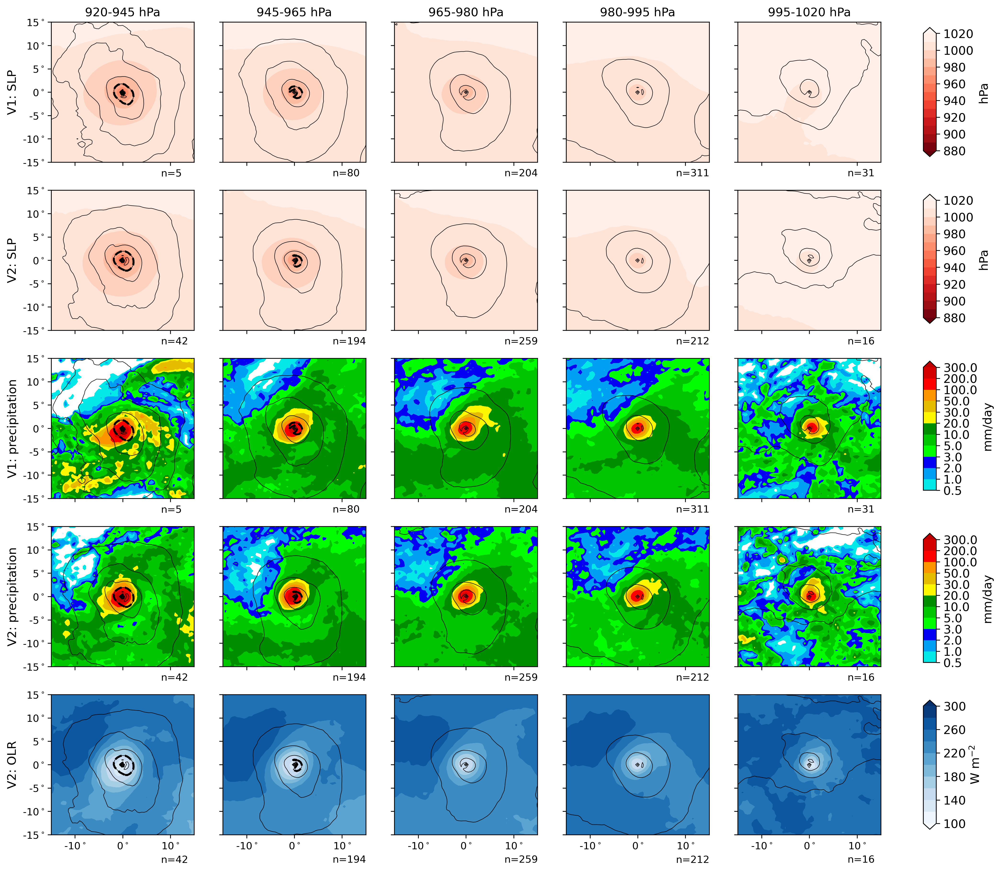

In [47]:

fig = plt.figure(figsize=(18,15), dpi=300)

#First row: V1 tangential velocity

#Blank plot in first spot
for i in np.arange(5):
    plt.subplot(5,6,i+1)
    plt.contour(ds_subsets['v1_'+bstrings[i+1]]['lon'], 
                ds_subsets['v1_'+bstrings[i+1]]['lat'],
                ds_subsets['v1_'+bstrings[i+1]]['u_tan'].mean(dim='storm'), 
                levels=np.linspace(-45,45,19), colors='k', linewidths=0.5)    
    plt.contour(ds_subsets['v1_'+bstrings[i+1]]['lon'], 
                ds_subsets['v1_'+bstrings[i+1]]['lat'],
                ds_subsets['v1_'+bstrings[i+1]]['u_tan'].mean(dim='storm'), 
                levels=[20], colors='k', linewidths=2, linestyles='dashed')
    plt.contourf(ds_subsets['v1_'+bstrings[i+1]]['lon'], 
                 ds_subsets['v1_'+bstrings[i+1]]['lat'],
                 ds_subsets['v1_'+bstrings[i+1]]['slp'].mean(dim='storm'), 
                 cmap=plt.cm.Reds_r, levels=np.linspace(880, 1020, 15), extend='both')
    plt.title(tstrings[i+1])
    plt.gca().xaxis.set_ticklabels([])
    if i > 0:
        plt.gca().yaxis.set_ticklabels([])
    else:
        plt.ylabel('V1: SLP', fontsize=12)
        plt.gca().yaxis.set_ticklabels(['-15$^\circ$', '-10$^\circ$', '-5$^\circ$', '0$^\circ$', 
                                        '5$^\circ$', '10$^\circ$', '15$^\circ$'])
    plt.text(8, -18, 'n='+str(len(ds_subsets['v1_'+bstrings[i+1]]['storm'])), fontsize=10)
#Colorbar in rightmost position
cbar = plt.colorbar(cax=fig.add_axes([0.8, 0.755, 0.01, 0.12]))#, ticks=np.linspace(-.25, .25, 5))
cbar.ax.set_ylabel('hPa', fontsize=12)
cbar.ax.tick_params(labelsize=12)
#cbar.ax.set_xticklabels(['-.25', '-.125', '0', '.125', '.25'])
    
#Second row: V2 vorticity.
for i in np.arange(5):
    plt.subplot(5,6,i+7)
    plt.contour(ds_subsets['v2_'+bstrings[i+1]]['lon'], 
                ds_subsets['v2_'+bstrings[i+1]]['lat'],
                ds_subsets['v2_'+bstrings[i+1]]['u_tan'].mean(dim='storm'), 
                levels=np.linspace(-45,45,19), colors='k', linewidths=0.5)
    plt.contour(ds_subsets['v2_'+bstrings[i+1]]['lon'], 
                ds_subsets['v2_'+bstrings[i+1]]['lat'],
                ds_subsets['v2_'+bstrings[i+1]]['u_tan'].mean(dim='storm'), 
                levels=[20], colors='k', linewidths=2, linestyles='dashed')
    plt.contourf(ds_subsets['v2_'+bstrings[i+1]]['lon'], 
                 ds_subsets['v2_'+bstrings[i+1]]['lat'],
                 ds_subsets['v2_'+bstrings[i+1]]['slp'].mean(dim='storm'), 
                 cmap=plt.cm.Reds_r, levels=np.linspace(880, 1020, 15), extend='both')
    plt.gca().xaxis.set_ticklabels([])
    if i > 0:
        plt.gca().yaxis.set_ticklabels([])
    else:
        plt.ylabel('V2: SLP', fontsize=12)
        plt.gca().yaxis.set_ticklabels(['-15$^\circ$', '-10$^\circ$', '-5$^\circ$', '0$^\circ$', 
                                        '5$^\circ$', '10$^\circ$', '15$^\circ$'])
    plt.text(8, -18, 'n='+str(len(ds_subsets['v2_'+bstrings[i+1]]['storm'])), fontsize=10)
#Colorbar in rightmost position
cbar = plt.colorbar(cax=fig.add_axes([0.8, 0.6, 0.01, 0.12]))#, ticks=np.linspace(-.25, .25, 5))
cbar.ax.set_ylabel('hPa', fontsize=12)
cbar.ax.tick_params(labelsize=12)
#cbar.ax.set_xticklabels(['-.25', '-.125', '0', '.125', '.25'])

#Third row: V1 precip.
for i in np.arange(5):
    plt.subplot(5,6,i+13)
    plt.contour(ds_subsets['v1_'+bstrings[i+1]]['lon'], 
                ds_subsets['v1_'+bstrings[i+1]]['lat'],
                ds_subsets['v1_'+bstrings[i+1]]['u_tan'].mean(dim='storm'), 
                levels=np.linspace(-45,45,19), colors='k', linewidths=0.5)
    plt.contour(ds_subsets['v1_'+bstrings[i+1]]['lon'], 
                ds_subsets['v1_'+bstrings[i+1]]['lat'],
                ds_subsets['v1_'+bstrings[i+1]]['u_tan'].mean(dim='storm'), 
                levels=[20], colors='k', linewidths=2, linestyles='dashed')
    plt.contourf(ds_subsets['v1_'+bstrings[i+1]]['lon'], 
                  ds_subsets['v1_'+bstrings[i+1]]['lat'],
                  ds_subsets['v1_'+bstrings[i+1]]['prec'].mean(dim='storm'), 
                  cmap=precip_colormap, levels=levels_custom, norm=norm_custom, extend='max') #pcolor is too grainy
    plt.gca().xaxis.set_ticklabels([])
    if i > 0:
        plt.gca().yaxis.set_ticklabels([])
    else:
        plt.ylabel('V1: precipitation', fontsize=12)
        plt.gca().yaxis.set_ticklabels(['-15$^\circ$', '-10$^\circ$', '-5$^\circ$', '0$^\circ$', 
                                        '5$^\circ$', '10$^\circ$', '15$^\circ$'])
    plt.text(8, -18, 'n='+str(len(ds_subsets['v1_'+bstrings[i+1]]['storm'])), fontsize=10)
cbar = plt.colorbar(cax=fig.add_axes([0.8, 0.445, 0.01, 0.12]))#, ticks=np.linspace(-.25, .25, 5))
cbar.ax.set_ylabel('mm/day', fontsize=12)
cbar.ax.tick_params(labelsize=12)    
cbar.set_ticks(levels_custom)

#Fourth row: V2 precip.
for i in np.arange(5):
    plt.subplot(5,6,i+19)
    plt.contour(ds_subsets['v2_'+bstrings[i+1]]['lon'], 
                ds_subsets['v2_'+bstrings[i+1]]['lat'],
                ds_subsets['v2_'+bstrings[i+1]]['u_tan'].mean(dim='storm'), 
                levels=np.linspace(-45,45,19), colors='k', linewidths=0.5)
    plt.contour(ds_subsets['v2_'+bstrings[i+1]]['lon'], 
                ds_subsets['v2_'+bstrings[i+1]]['lat'],
                ds_subsets['v2_'+bstrings[i+1]]['u_tan'].mean(dim='storm'), 
                levels=[20], colors='k', linewidths=2, linestyles='dashed')
    plt.contourf(ds_subsets['v2_'+bstrings[i+1]]['lon'], 
                 ds_subsets['v2_'+bstrings[i+1]]['lat'],
                 ds_subsets['v2_'+bstrings[i+1]]['precip'].mean(dim='storm'),  
                 cmap=precip_colormap, levels=levels_custom, norm=norm_custom, extend='max')
    plt.gca().xaxis.set_ticklabels([])
    if i > 0:
        plt.gca().yaxis.set_ticklabels([])
    else:
        plt.ylabel('V2: precipitation', fontsize=12)
        plt.gca().yaxis.set_ticklabels(['-15$^\circ$', '-10$^\circ$', '-5$^\circ$', '0$^\circ$', 
                                        '5$^\circ$', '10$^\circ$', '15$^\circ$'])
    plt.text(8, -18, 'n='+str(len(ds_subsets['v2_'+bstrings[i+1]]['storm'])), fontsize=10)
cbar = plt.colorbar(cax=fig.add_axes([0.8, 0.285, 0.01, 0.12]))#, ticks=np.linspace(-.25, .25, 5))
cbar.ax.set_ylabel('mm/day', fontsize=12)
cbar.ax.tick_params(labelsize=12)
cbar.set_ticks(levels_custom)


#Fifth row: V2 OLR.
for i in np.arange(5):
    plt.subplot(5,6,i+25)
    plt.contour(ds_subsets['v2_'+bstrings[i+1]]['lon'], 
                ds_subsets['v2_'+bstrings[i+1]]['lat'],
                ds_subsets['v2_'+bstrings[i+1]]['u_tan'].mean(dim='storm'), 
                levels=np.linspace(-45,45,19), colors='k', linewidths=0.5)
    plt.contour(ds_subsets['v2_'+bstrings[i+1]]['lon'], 
                ds_subsets['v2_'+bstrings[i+1]]['lat'],
                ds_subsets['v2_'+bstrings[i+1]]['u_tan'].mean(dim='storm'), 
                levels=[20], colors='k', linewidths=2, linestyles='dashed')
    plt.contourf(ds_subsets['v2_'+bstrings[i+1]]['lon'], 
                 ds_subsets['v2_'+bstrings[i+1]]['lat'],
                 ds_subsets['v2_'+bstrings[i+1]]['olr'].mean(dim='storm'),
                 cmap=plt.cm.Blues, levels=np.linspace(100,300,11), extend='both')
    if i > 0:
        plt.gca().yaxis.set_ticklabels([])
    else:
        plt.ylabel('V2: OLR', fontsize=12)
        plt.gca().yaxis.set_ticklabels(['-15$^\circ$', '-10$^\circ$', '-5$^\circ$', '0$^\circ$', 
                                        '5$^\circ$', '10$^\circ$', '15$^\circ$'])
    plt.text(8, -21, 'n='+str(len(ds_subsets['v2_'+bstrings[i+1]]['storm'])), fontsize=10)
    plt.gca().set_xticks([-10, 0, 10])
    plt.gca().xaxis.set_ticklabels(['-10$^\circ$', '0$^\circ$', '10$^\circ$'])
cbar = plt.colorbar(cax=fig.add_axes([0.8, 0.13, 0.01, 0.12]))#, ticks=np.linspace(-.25, .25, 5))
cbar.ax.set_ylabel('W m$^{-2}$', fontsize=12)
cbar.ax.tick_params(labelsize=12)

#plt.tight_layout()

#plt.savefig('plots/storm_centered_NH_tangetial_contours_both_precip.png')
#plt.savefig('plots/storm_centered_NH_tangetial_contours_both_precip.pdf')

#For version with extended colormap, simpler name
plt.savefig('plots/storm_centered_NH_composite.png')
plt.savefig('plots/storm_centered_NH_composite.pdf')

In [48]:

#####   CASE STUDY OF STRONGEST V2 STORM   #####


In [94]:
#(Do later)
#Just SLP, precip., OLR. 3 panels side by side

/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_launcher.py:18: UserWarning: FixedFormatter should only be used together with FixedLocator
/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_launcher.py:19: UserWarning: FixedFormatter should only be used together with FixedLocator
/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_launcher.py:41: UserWarning: FixedFormatter should only be used together with FixedLocator
/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_launcher.py:42: UserWarning: FixedFormatter should only be used together with FixedLocator
/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_launcher.py:66: UserWarning: FixedFormatter should only be used together with FixedLocator
/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_launcher.py:67: UserWarning: FixedFormatter should only be used together with FixedLocator


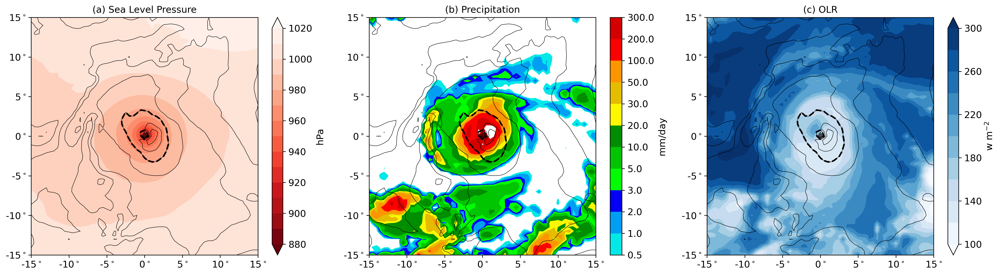

In [110]:
fig = plt.figure(figsize=(18,5), dpi=300)

#SLP

plt.subplot(1,3,1)
plt.contour(ds_subsets['v2_'+bstrings[0]]['lon'], 
            ds_subsets['v2_'+bstrings[0]]['lat'],
            ds_subsets['v2_'+bstrings[0]]['u_tan'].mean(dim='storm'), 
            levels=np.linspace(-45,45,19), colors='k', linewidths=0.5)
plt.contour(ds_subsets['v2_'+bstrings[0]]['lon'], 
            ds_subsets['v2_'+bstrings[0]]['lat'],
            ds_subsets['v2_'+bstrings[0]]['u_tan'].mean(dim='storm'), 
            levels=[20], colors='k', linewidths=2, linestyles='dashed')
plt.contourf(ds_subsets['v2_'+bstrings[0]]['lon'], 
             ds_subsets['v2_'+bstrings[0]]['lat'],
             ds_subsets['v2_'+bstrings[0]]['slp'].mean(dim='storm'), 
             cmap=plt.cm.Reds_r, levels=np.linspace(880, 1020, 15), extend='both')
plt.gca().xaxis.set_ticklabels(['-15$^\circ$', '-10$^\circ$', '-5$^\circ$', '0$^\circ$', '5$^\circ$', '10$^\circ$', '15$^\circ$'])
plt.gca().yaxis.set_ticklabels(['-15$^\circ$', '-10$^\circ$', '-5$^\circ$', '0$^\circ$', '5$^\circ$', '10$^\circ$', '15$^\circ$'])
cbar = plt.colorbar()
cbar.ax.set_ylabel('hPa', fontsize=12)
cbar.ax.tick_params(labelsize=12)
plt.gca().tick_params(labelsize=12)
plt.title('(a) Sea Level Pressure', fontsize=12)

#Precip. 
plt.subplot(1,3,2)
plt.contour(ds_subsets['v2_'+bstrings[0]]['lon'], 
            ds_subsets['v2_'+bstrings[0]]['lat'],
            ds_subsets['v2_'+bstrings[0]]['u_tan'].mean(dim='storm'), 
            levels=np.linspace(-45,45,19), colors='k', linewidths=0.5)
plt.contour(ds_subsets['v2_'+bstrings[0]]['lon'], 
            ds_subsets['v2_'+bstrings[0]]['lat'],
            ds_subsets['v2_'+bstrings[0]]['u_tan'].mean(dim='storm'), 
            levels=[20], colors='k', linewidths=2, linestyles='dashed')
plt.contourf(ds_subsets['v2_'+bstrings[0]]['lon'], 
             ds_subsets['v2_'+bstrings[0]]['lat'],
             ds_subsets['v2_'+bstrings[0]]['precip'].mean(dim='storm'),  
             cmap=precip_colormap, levels=levels_custom, norm=norm_custom)
#plt.gca().yaxis.set_ticklabels([])
plt.gca().xaxis.set_ticklabels(['-15$^\circ$', '-10$^\circ$', '-5$^\circ$', '0$^\circ$', '5$^\circ$', '10$^\circ$', '15$^\circ$'])
plt.gca().yaxis.set_ticklabels(['-15$^\circ$', '-10$^\circ$', '-5$^\circ$', '0$^\circ$', '5$^\circ$', '10$^\circ$', '15$^\circ$'])
cbar = plt.colorbar()
cbar.ax.set_ylabel('mm/day', fontsize=12)
cbar.ax.tick_params(labelsize=12)
cbar.set_ticks(levels_custom)
plt.gca().tick_params(labelsize=12)
plt.title('(b) Precipitation', fontsize=12)


#OLR
plt.subplot(1,3,3)
plt.contour(ds_subsets['v2_'+bstrings[0]]['lon'], 
            ds_subsets['v2_'+bstrings[0]]['lat'],
            ds_subsets['v2_'+bstrings[0]]['u_tan'].mean(dim='storm'), 
            levels=np.linspace(-45,45,19), colors='k', linewidths=0.5)
plt.contour(ds_subsets['v2_'+bstrings[0]]['lon'], 
            ds_subsets['v2_'+bstrings[0]]['lat'],
            ds_subsets['v2_'+bstrings[0]]['u_tan'].mean(dim='storm'), 
            levels=[20], colors='k', linewidths=2, linestyles='dashed')
plt.contourf(ds_subsets['v2_'+bstrings[0]]['lon'], 
             ds_subsets['v2_'+bstrings[0]]['lat'],
             ds_subsets['v2_'+bstrings[0]]['olr'].mean(dim='storm'),
             cmap=plt.cm.Blues, levels=np.linspace(100,300,11), extend='both')
#plt.gca().yaxis.set_ticklabels([])
plt.gca().xaxis.set_ticklabels(['-15$^\circ$', '-10$^\circ$', '-5$^\circ$', '0$^\circ$', '5$^\circ$', '10$^\circ$', '15$^\circ$'])
plt.gca().yaxis.set_ticklabels(['-15$^\circ$', '-10$^\circ$', '-5$^\circ$', '0$^\circ$', '5$^\circ$', '10$^\circ$', '15$^\circ$'])
cbar = plt.colorbar()
cbar.ax.set_ylabel('w m$^{-2}$', fontsize=12)
cbar.ax.tick_params(labelsize=12)
plt.gca().tick_params(labelsize=12)
plt.title('(c) OLR', fontsize=12)

plt.tight_layout()


plt.savefig('plots/case_study_v2_strongest.png')
plt.savefig('plots/case_study_v2_strongest.pdf')

In [49]:

#Context for this storm: look through ds_tracks_v2

#(March 18th, 2021)


In [50]:
print(ds_tracks_v2['min_pressure'])

<xarray.DataArray 'min_pressure' (storm: 1157)>
array([9.74, 9.92, 9.28, ..., 9.93, 9.6 , 9.7 ])
Coordinates:
  * storm    (storm) int64 0 1 2 3 4 5 6 7 8 9 ... 45 46 47 48 49 50 51 52 53 54


In [51]:
print(np.argmin(ds_tracks_v2['min_pressure'].data))

794


In [52]:
print(ds_tracks_v2.isel(storm=794))

<xarray.Dataset>
Dimensions:       (date_time: 360)
Coordinates:
  * date_time     (date_time) int64 0 1 2 3 4 5 6 ... 354 355 356 357 358 359
    storm         int64 21
Data variables:
    lon           (date_time) float64 ...
    lat           (date_time) float64 ...
    wind          (date_time) float64 ...
    pressure      (date_time) float64 9.74 9.73 9.7 9.7 9.66 ... nan nan nan nan
    year          (date_time) float64 ...
    month         (date_time) float64 ...
    day           (date_time) float64 ...
    hour          (date_time) float64 ...
    wind_kts      (date_time) float64 48.27 50.77 54.78 53.24 ... nan nan nan
    lon360        (date_time) float64 ...
    in_NH         (date_time) bool ...
    in_SH         (date_time) bool ...
    in_NI         (date_time) bool ...
    in_WP         (date_time) bool ...
    in_EP         (date_time) bool ...
    in_NA         (date_time) bool ...
    in_SI         (date_time) bool ...
    in_AUS        (date_time) bool ...
    in_

In [1]:
#More context: when does storm form?
print(ds_tracks_v2.isel(storm=794).year)
print(ds_tracks_v2.isel(storm=794).month)
print(ds_tracks_v2.isel(storm=794).day)
print(ds_tracks_v2.isel(storm=794).hour)

In [53]:
strongest_storm = ds_tracks_v2.isel(storm=np.argmin(ds_tracks_v2['min_pressure'].data))

<xarray.DataArray 'pressure' (date_time: 360)>
array([9.74, 9.73, 9.7 , ...,  nan,  nan,  nan])
Coordinates:
  * date_time  (date_time) int64 0 1 2 3 4 5 6 7 ... 353 354 355 356 357 358 359
    storm      int64 21
9.18


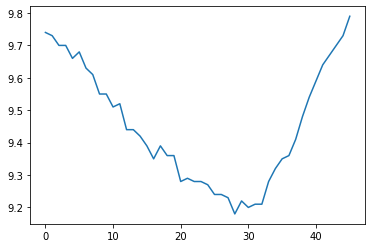

In [54]:
print(strongest_storm['pressure'])
print(np.nanmin(strongest_storm['pressure'].data))
plt.plot(strongest_storm['pressure'])

In [55]:
#Find index of the max pressure
p_array = strongest_storm['pressure'].data
pmin_index = np.argmin(p_array[~np.isnan(p_array)])
print(pmin_index)

28


73.8076048
29


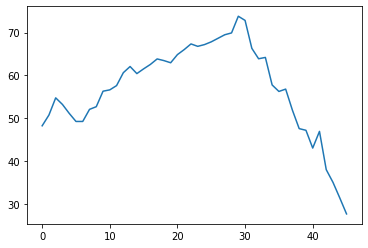

In [56]:
print(np.nanmax(strongest_storm['wind_kts'].data))
plt.plot(strongest_storm['wind_kts'])
w_array = strongest_storm['wind_kts'].data
wmax_index = np.argmax(w_array[~np.isnan(w_array)])
print(wmax_index)

In [57]:
for nhreg in ['NI', 'WP', 'EP', 'NA']:
    print(nhreg)
    print(strongest_storm['gen_'+nhreg])

NI
<xarray.DataArray 'gen_NI' ()>
array(False)
Coordinates:
    storm    int64 21
WP
<xarray.DataArray 'gen_WP' ()>
array(True)
Coordinates:
    storm    int64 21
EP
<xarray.DataArray 'gen_EP' ()>
array(False)
Coordinates:
    storm    int64 21
NA
<xarray.DataArray 'gen_NA' ()>
array(False)
Coordinates:
    storm    int64 21


In [58]:
print(strongest_storm['lon'])
print(strongest_storm['lat'])
print(strongest_storm['pressure'][pmin_index]) #This worked
print(strongest_storm['lon'][pmin_index])
print(strongest_storm['lat'][pmin_index])
print(strongest_storm['wind_kts'][pmin_index])

<xarray.DataArray 'lon' (date_time: 360)>
array([143.75, 144.25, 144.75, ...,    nan,    nan,    nan])
Coordinates:
  * date_time  (date_time) int64 0 1 2 3 4 5 6 7 ... 353 354 355 356 357 358 359
    storm      int64 21
<xarray.DataArray 'lat' (date_time: 360)>
array([10.75, 11.25, 12.75, ...,   nan,   nan,   nan])
Coordinates:
  * date_time  (date_time) int64 0 1 2 3 4 5 6 7 ... 353 354 355 356 357 358 359
    storm      int64 21
<xarray.DataArray 'pressure' ()>
array(9.18)
Coordinates:
    date_time  int64 28
    storm      int64 21
<xarray.DataArray 'lon' ()>
array(129.25)
Coordinates:
    date_time  int64 28
    storm      int64 21
<xarray.DataArray 'lat' ()>
array(21.75)
Coordinates:
    date_time  int64 28
    storm      int64 21
<xarray.DataArray 'wind_kts' ()>
array(69.919925)
Coordinates:
    date_time  int64 28
    storm      int64 21


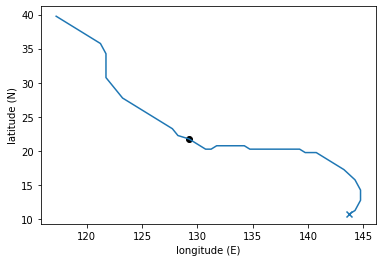

In [59]:
#Map of the track with location of strongest storm marked
plt.plot(strongest_storm['lon'], strongest_storm['lat'])
plt.scatter(strongest_storm['lon'][0], strongest_storm['lat'][0], marker='x')
plt.scatter(strongest_storm['lon'][pmin_index], strongest_storm['lat'][pmin_index], c='k')
plt.xlabel('longitude (E)')
plt.ylabel('latitude (N)')
plt.savefig('plots/quick_map_of_strongest_storm.png')
plt.savefig('plots/quick_map_of_strongest_storm.pdf')

/opt/sw/anaconda3/envs/pangeoxtd36/lib/python3.6/site-packages/ipykernel_launcher.py:82: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


[143.75 144.25 144.75 144.75 144.25 143.25 142.75 141.75 141.25 140.75
 139.75 139.25 138.75 137.75 136.75 136.25 135.75 134.75 134.25 133.75
 132.75 132.25 131.75 131.25 130.75 130.75 130.25 129.75 129.25 128.25
 127.75 126.75 125.75 124.75 124.25 123.25 122.75 122.25 121.75 121.75
 121.75 121.25 119.75 118.75 117.75 117.25]
[10.75 11.25 12.75 14.25 15.75 17.25 17.75 18.75 19.25 19.75 19.75 20.25
 20.25 20.25 20.25 20.25 20.25 20.25 20.75 20.75 20.75 20.75 20.75 20.25
 20.25 20.25 20.75 21.25 21.75 22.25 23.25 24.25 25.25 26.25 26.75 27.75
 28.75 29.75 30.75 32.25 34.25 35.75 37.25 38.25 39.25 39.75]


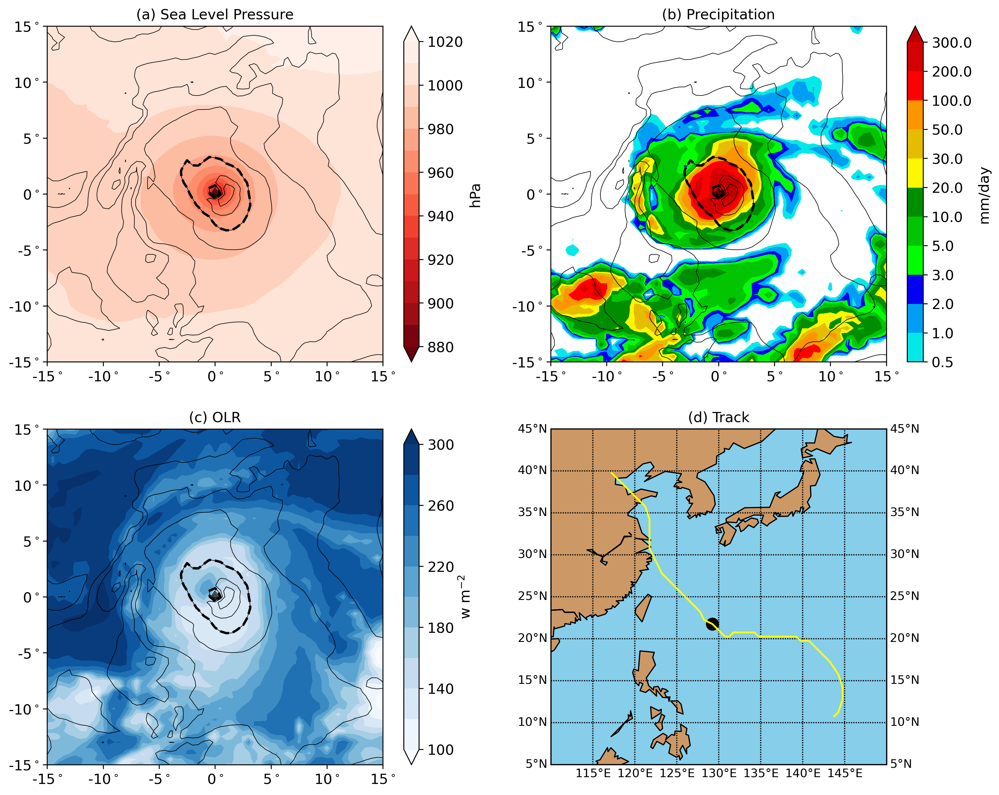

In [90]:
#4-panel version of the case study figure including the map

fig = plt.figure(figsize=(14,11.5), dpi=300)

#SLP

plt.subplot(2,2,1)
plt.contour(ds_subsets['v2_'+bstrings[0]]['lon'], 
            ds_subsets['v2_'+bstrings[0]]['lat'],
            ds_subsets['v2_'+bstrings[0]]['u_tan'].mean(dim='storm'), 
            levels=np.linspace(-45,45,19), colors='k', linewidths=0.5)
plt.contour(ds_subsets['v2_'+bstrings[0]]['lon'], 
            ds_subsets['v2_'+bstrings[0]]['lat'],
            ds_subsets['v2_'+bstrings[0]]['u_tan'].mean(dim='storm'), 
            levels=[20], colors='k', linewidths=2, linestyles='dashed')
plt.contourf(ds_subsets['v2_'+bstrings[0]]['lon'], 
             ds_subsets['v2_'+bstrings[0]]['lat'],
             ds_subsets['v2_'+bstrings[0]]['slp'].mean(dim='storm'), 
             cmap=plt.cm.Reds_r, levels=np.linspace(880, 1020, 15), extend='both')
plt.gca().xaxis.set_ticklabels(['-15$^\circ$', '-10$^\circ$', '-5$^\circ$', '0$^\circ$', '5$^\circ$', '10$^\circ$', '15$^\circ$'])
plt.gca().yaxis.set_ticklabels(['-15$^\circ$', '-10$^\circ$', '-5$^\circ$', '0$^\circ$', '5$^\circ$', '10$^\circ$', '15$^\circ$'])
cbar = plt.colorbar()
cbar.ax.set_ylabel('hPa', fontsize=12)
cbar.ax.tick_params(labelsize=12)
plt.gca().tick_params(labelsize=12)
plt.title('(a) Sea Level Pressure', fontsize=12)

#Precip. 
plt.subplot(2,2,2)
plt.contour(ds_subsets['v2_'+bstrings[0]]['lon'], 
            ds_subsets['v2_'+bstrings[0]]['lat'],
            ds_subsets['v2_'+bstrings[0]]['u_tan'].mean(dim='storm'), 
            levels=np.linspace(-45,45,19), colors='k', linewidths=0.5)
plt.contour(ds_subsets['v2_'+bstrings[0]]['lon'], 
            ds_subsets['v2_'+bstrings[0]]['lat'],
            ds_subsets['v2_'+bstrings[0]]['u_tan'].mean(dim='storm'), 
            levels=[20], colors='k', linewidths=2, linestyles='dashed')
plt.contourf(ds_subsets['v2_'+bstrings[0]]['lon'], 
             ds_subsets['v2_'+bstrings[0]]['lat'],
             ds_subsets['v2_'+bstrings[0]]['precip'].mean(dim='storm'),  
             cmap=precip_colormap, levels=levels_custom, norm=norm_custom, extend='max')
#plt.gca().yaxis.set_ticklabels([])
plt.gca().xaxis.set_ticklabels(['-15$^\circ$', '-10$^\circ$', '-5$^\circ$', '0$^\circ$', '5$^\circ$', '10$^\circ$', '15$^\circ$'])
plt.gca().yaxis.set_ticklabels(['-15$^\circ$', '-10$^\circ$', '-5$^\circ$', '0$^\circ$', '5$^\circ$', '10$^\circ$', '15$^\circ$'])
cbar = plt.colorbar()
cbar.ax.set_ylabel('mm/day', fontsize=12)
cbar.ax.tick_params(labelsize=12)
cbar.set_ticks(levels_custom)
plt.gca().tick_params(labelsize=12)
plt.title('(b) Precipitation', fontsize=12)


#OLR
plt.subplot(2,2,3)
plt.contour(ds_subsets['v2_'+bstrings[0]]['lon'], 
            ds_subsets['v2_'+bstrings[0]]['lat'],
            ds_subsets['v2_'+bstrings[0]]['u_tan'].mean(dim='storm'), 
            levels=np.linspace(-45,45,19), colors='k', linewidths=0.5)
plt.contour(ds_subsets['v2_'+bstrings[0]]['lon'], 
            ds_subsets['v2_'+bstrings[0]]['lat'],
            ds_subsets['v2_'+bstrings[0]]['u_tan'].mean(dim='storm'), 
            levels=[20], colors='k', linewidths=2, linestyles='dashed')
plt.contourf(ds_subsets['v2_'+bstrings[0]]['lon'], 
             ds_subsets['v2_'+bstrings[0]]['lat'],
             ds_subsets['v2_'+bstrings[0]]['olr'].mean(dim='storm'),
             cmap=plt.cm.Blues, levels=np.linspace(100,300,11), extend='both')
#plt.gca().yaxis.set_ticklabels([])
plt.gca().xaxis.set_ticklabels(['-15$^\circ$', '-10$^\circ$', '-5$^\circ$', '0$^\circ$', '5$^\circ$', '10$^\circ$', '15$^\circ$'])
plt.gca().yaxis.set_ticklabels(['-15$^\circ$', '-10$^\circ$', '-5$^\circ$', '0$^\circ$', '5$^\circ$', '10$^\circ$', '15$^\circ$'])
cbar = plt.colorbar()
cbar.ax.set_ylabel('w m$^{-2}$', fontsize=12)
cbar.ax.tick_params(labelsize=12)
plt.gca().tick_params(labelsize=12)
plt.title('(c) OLR', fontsize=12)

#4th panel: map
ax4 = plt.subplot(2,2,4)


m = Basemap(projection='cyl', #lon_0=-180, lat_0=0, 
            llcrnrlon=110, llcrnrlat=5,
            urcrnrlon=150, urcrnrlat=45) 
m.drawcoastlines(linewidth=1)
m.drawparallels(np.linspace(5,45,9), labels=[1,1,0,0])
m.drawmeridians(np.linspace(115,145,7), labels=[0,0,0,1])
m.fillcontinents(color='#cc9966', lake_color='skyblue')
m.drawmapboundary(fill_color='skyblue')
x_raw = strongest_storm['lon'].data
y_raw = strongest_storm['lat'].data
x_nonan = x_raw[~np.isnan(x_raw)]
y_nonan = y_raw[~np.isnan(y_raw)]
print(x_nonan)
print(y_nonan)
m.plot(x_nonan, y_nonan, latlon='true', color='yellow')
#m.scatter(strongest_storm['lon'][0], strongest_storm['lat'][0], marker='x', c='k', latlon='true')
m.scatter(strongest_storm['lon'][pmin_index], strongest_storm['lat'][pmin_index], 
          marker='o', c='k', latlon='true', s=100)
plt.title('(d) Track', fontsize=12)

#Shift position of the box to align with the one above
#ax4 = plt.gca()
pos = ax4.get_position()
ax4.set_position([pos.x0-0.035, pos.y0, pos.width, pos.height])

#plt.tight_layout()


#plt.savefig('plots/case_study_v2_strongest_withMap.png')
#plt.savefig('plots/case_study_v2_strongest_withMap.pdf')

#For version with the extended colormap and track aligned with other panels
plt.savefig('plots/case_study_v2_strongest_aligned_map.png')
plt.savefig('plots/case_study_v2_strongest_aligned_map.pdf')